In [1]:
import sys
sys.path.append("../")

In [2]:
import pandas as pd
import plotly.graph_objects as go
from plotting import CandlePlot
import numpy as np

from simulation.pair_trade_percent_binance import PairTradePercent
from technicals.indicators import Donchian_Close

from functools import reduce


from sklearn.preprocessing import StandardScaler

In [3]:

from multiprocessing import Process, Manager
import pickle
import warnings
warnings.filterwarnings('ignore')

In [4]:
from sklearn.linear_model import LinearRegression

def synchronize_dataframes(dfs, df_target, target_name='Target'):
    """
    Sincroniza múltiplos DataFrames pelo timestamp e calcula o índice baseado em regressão multivariada.
    :param dfs: Lista de DataFrames contendo os preços de fechamento dos ativos.
    :param df_target: DataFrame do ativo alvo.
    :param target_name: Nome do ativo alvo (usado no resultado final).
    :return: DataFrame sincronizado com o índice de regressão e o spread.
    """
    # Mesclar todos os DataFrames pelo Timestamp
    df = df_target[['Time', 'Close', 'High', 'Low']].rename(columns={'Close': target_name})
    for i, df_pair in enumerate(dfs):
        df = pd.merge(df, df_pair[['Time', 'Close']].rename(columns={'Close': f'Asset_{i}'}), 
                      on='Time', how='inner')
    return df

def apply_regression(df, target_name):
    # # Aplicar regressão para criar o índice base
    # asset_columns = [col for col in df.columns if col.startswith('Asset_')]
    # X = df[asset_columns].values  # Matriz de ativos do cluster
    # y = df[target_name].values  # Preços do ativo alvo
    # model = LinearRegression().fit(X, y)
    # df['Regression_Index'] = model.predict(X)

    """
    Aplica regressão linear com normalização para calcular o índice base.
    """
    asset_columns = [col for col in df.columns if col.startswith('Asset_')]
    X = df[asset_columns].values  # Matriz de ativos do cluster
    y = df[target_name].values  # Preços do ativo alvo

    # Normalizar os dados
    scaler = StandardScaler()
    X_normalized = scaler.fit_transform(X)
    y_normalized = scaler.fit_transform(y.reshape(-1, 1)).flatten()

    # Aplicar regressão
    model = LinearRegression().fit(X_normalized, y_normalized)
    y_pred_normalized = model.predict(X_normalized)

    # Reverter a normalização para obter o índice em escala original
    y_pred = scaler.inverse_transform(y_pred_normalized.reshape(-1, 1)).flatten()
    df['Regression_Index'] = y_pred
    
    return df

def calculate_zscore(df, spread_column='Spread', window=50):
    """
    Calcula o Z-Score do spread usando uma janela móvel.
    :param df: DataFrame com a coluna 'Spread'.
    :param spread_column: Nome da coluna de spread.
    :param window: Tamanho da janela para calcular a média e o desvio padrão.
    :return: DataFrame atualizado com a coluna 'Z-Score'.
    """
    df['Spread_Mean'] = df[spread_column].rolling(window=window).mean()
    df['Spread_Std'] = df[spread_column].rolling(window=window).std()
    df['Z-Score'] = (df[spread_column] - df['Spread_Mean']) / df['Spread_Std']
    return df


In [5]:
def run_pair(granularity,
             lenght=10000,
             strategy=1,
             target_asset='VIDTUSDT',
             cluster_asset=['AVAXUSDT','BNBUSDT','LTCUSDT'],
             entry_threshold=3,
             exit_threshold=0,
             window=50
            ):

    # Carregar os DataFrames de ativos
    df_target = pd.read_pickle(f"crypto/{target_asset}_{granularity}.pkl")
    dfs_cluster = [
        pd.read_pickle(f"crypto/{asset}_{granularity}.pkl") for asset in cluster_asset
    ]
    
    
    # Sincronizar e calcular o índice PCA e o spread
    df = synchronize_dataframes(dfs_cluster, df_target, target_name=target_asset)
    
    df = apply_regression(df, target_asset)
    
    
    # Calcular o spread com o ativo alvo
    df['Spread'] = df[target_asset] - df['Regression_Index']


    # Calcular o Z-Score do spread
    df = calculate_zscore(df, spread_column='Spread', window=200)

    df['Close_Pair1'] = df[target_asset]
    
    df.dropna(inplace=True)
    df.reset_index(drop=True, inplace=True)

    corr = 0
    spread_vol = 0


    df['time'] = df['Time'].copy()
    df['strategy_pair1'] = 0
    # dff['returns'] = dff['Close'].pct_change()
    df['returns_pair1'] = np.log(df['Close_Pair1'] / df['Close_Pair1'].shift(1))
    df['creturns_pair1'] = df['returns_pair1'].cumsum()
    df['Log_Returns_pair1'] = np.log(df['Close_Pair1'] / df['Close_Pair1'].shift(1))
    df['cLog_Returns_pair1'] = df['Log_Returns_pair1'].cumsum()

    # df = df.iloc[lenght:]
    df = df[df['Time'] >= lenght]
    
    df.dropna(inplace=True)
    
    df.reset_index(drop=True, inplace=True)


    

    
    gt = PairTradePercent(
        df,
        strategy,
        entry_threshold,
        exit_threshold,
        corr,
        spread_vol
    )
    
    gt.run_test()
    return gt
    

In [31]:
target_assets = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT','BTCUSDT',
          'ETHUSDT','AVAXUSDT','BNBUSDT','LTCUSDT','LINKUSDT',
         'BCHUSDT','EOSUSDT','ETCUSDT','DASHUSDT','ALGOUSDT','SANDUSDT',
         'ARUSDT', 'INJUSDT', 'MASKUSDT', 'CELOUSDT', 'BANDUSDT', 'ALPHAUSDT', 'PERPUSDT',
         'ACHUSDT', 'CHRUSDT', 'BELUSDT']
cluster_assets = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT','BTCUSDT',
          'ETHUSDT','AVAXUSDT','BNBUSDT','LTCUSDT','LINKUSDT',
         'BCHUSDT','EOSUSDT','ETCUSDT','DASHUSDT','ALGOUSDT','SANDUSDT',
         'ARUSDT', 'INJUSDT', 'MASKUSDT', 'CELOUSDT', 'BANDUSDT', 'ALPHAUSDT', 'PERPUSDT',
         'ACHUSDT', 'CHRUSDT', 'BELUSDT']


# pairs1 = ['BELUSDT']
# pairs2 = ['DOTUSDT']

In [32]:
# df.columns

In [33]:
def get_list_args():
    args_dic_list = []
    for target_asset in target_assets:
        for cluster_asset in [cluster_assets]:
            cluster_asset__ = []
            for i in cluster_asset:
                if i != target_asset:
                    cluster_asset__.append(i)
            for granularity in ['1m']:
                for lenght in ['2023-01-01 00:00:00']:
                    for strategy in [1]:
                        for entry_threshold in [2,3,4,5,6]:
                            for exit_threshold in [0]:
                                for window in [200]:
                                
                                    args_dic = {
                                        "granularity":granularity,
                                        'lenght': lenght,
                                        'strategy':strategy,
                                        'target_asset': target_asset,
                                        'cluster_asset':cluster_asset__,
                                        'entry_threshold':entry_threshold,
                                        'exit_threshold':exit_threshold,
                                        'window':window
                                    }
                                    args_dic_list.append(args_dic)

    return args_dic_list

In [34]:

def run_process(L, arg):
    # print("PROCESS",arg)
    L.append(
        dict(
            arg=arg,
            target_asset=arg['target_asset'],
            cluster_asset=arg['cluster_asset'],
            granularity=arg['granularity'],
            lenght = arg['lenght'],
            strategy = arg['strategy'],
            entry_threshold = arg['entry_threshold'],
            exit_threshold = arg['exit_threshold'],
            window = arg['window'],
            res=run_pair(
                granularity=arg['granularity'],
                lenght = arg['lenght'],
                strategy= arg['strategy'],
                target_asset=arg['target_asset'],
                cluster_asset=arg['cluster_asset'],
                entry_threshold = arg['entry_threshold'],
                exit_threshold = arg['exit_threshold'],
                window = arg['window']
            )
        )
    )


lista = []
def run_ema_macd():
    with Manager() as manager:
        global lista
        L = manager.list()  # <-- can be shared between processes.
        args_list = get_list_args()
        print(len(args_list))
        limit = 10
        current = 0
    
        while current < len(args_list):
            print(current)
            processes = []
            todo = len(args_list) - current
            if todo < limit:
                limit = todo
    
            for _ in range(limit):
                processes.append(Process(target=run_process, args=(L,args_list[current])))
                current += 1
    
            for p in processes:
                p.start()
    
            for p in processes:
                p.join()

        print("ALL DONE")
        lista = list(L)
        

In [35]:
%%time

run_ema_macd()

150
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
ALL DONE
CPU times: user 357 ms, sys: 2.58 s, total: 2.94 s
Wall time: 17min 40s


In [23]:


# ddf = lista[0]['res'].df.copy()

In [47]:
# with open(f"./result-pair-trading-new-data-strategy-1-CPA-with-sl-0.05-1min-2023-to-end.pkl", "wb") as f:
#     pickle.dump(lista, f)  # Usa o pickle para salvar o arquivo



In [48]:
# listaa = []

# # Carregar os arquivos e expandir seus conteúdos diretamente na lista principal
# for filename in [
#     "./result-binance-acumulative-percentual-strategy-1-2-3-4-5.pkl",
#     "./result-binance-acumulative-percentual-strategy-6-7-8-9.pkl",
#     "./result-binance-acumulative-percentual-strategy-10-11-12.pkl"
# ]:
#     with open(filename, "rb") as f:
#         listaa.extend(pickle.load(f))
        
# with open(f"./result-binance-acumulative-percentual-strategy-1-12.pkl", "wb") as f:
#     pickle.dump(listaa, f)  # Usa o pickle para salvar o arquivo



In [49]:
# cp = CandlePlot(ddf.iloc[-50000:],candles=False)


# trades_up = cp.df_plot[cp.df_plot.SIGNAL_UP_PAIR1 == 1]

# trades_down = cp.df_plot[cp.df_plot.SIGNAL_DOWN_PAIR1 == 1]

# print(len(trades_up),len(trades_down))

In [50]:

# marker_trade_up = '#abebc6'
# marker_trade_down = '#cccddd'


# markers = 'Close_Pair1'


# cp.add_traces(['Close_Pair1'])


# # # SIGNAL UP
# cp.fig.add_trace(go.Scatter(
#     x = trades_up.sTime,
#     y = trades_up[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-up',
#     marker=dict(color=marker_trade_up, size=12)
# ))

# cp.fig.add_trace(go.Scatter(
#     x = trades_down.sTime,
#     y = trades_down[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-down',
#     marker=dict(color=marker_trade_down, size=12)
# ))


# cp.show_plot(height=700, width=1100, sec_traces=['PCA_Index'])

In [36]:
res = lista

# with open(f"./result-binance-acumulative-percentual-new-data-strategy-14-1min-2024-split_profit.pkl", "rb") as f:
#     res = pickle.load(f)

In [37]:

dic_res = []
for r in res:

    if r['res'].len_close > 0:
        signal_up = r['res'].df_results.SIGNAL_UP.values[-1]

        res_pos_s = r['res'].df_results[r['res'].df_results['strategy_pair1'] > 0]
        res_neg_s = r['res'].df_results[r['res'].df_results['strategy_pair1'] <= 0]
        sum_neg_s = res_neg_s.strategy_pair1.sum() *-1
        sum_pos_s = res_pos_s.strategy_pair1.sum()
        dic_res.append(
            dict(
                pair1 = r['target_asset'],
                granularity = r['granularity'],
                strat = round(r['res'].df_results.strategy_pair1.sum(),3),
                c = r['res'].df_results['count'].mean(),
                max_o = max(r['res'].df_results.total_opened),
                st = r['res'].strategy,
                entry_threshold = r['entry_threshold'],
                window = r['window'],
                
                corr = r['res'].corr,
                spread_vol = r['res'].spread_vol,
                s_p_strat = sum_pos_s,
                s_n_strat = sum_neg_s,
                Rel_sum = sum_pos_s/(sum_pos_s+ sum_neg_s),
        
                
                l_p_strat = len(res_pos_s),
                l_n_strat = len(res_neg_s),
                Rel_len = len(res_pos_s)/(len(res_pos_s)+ len(res_neg_s)),

                l_c = r['res'].len_close,
                l_o = r['res'].len_open,
                   

                first_p = r['res'].first_price,
                last_p = r['res'].last_price,

                first_t = r['res'].df_results.start_time.values[0],
                last_t = r['res'].df_results.end_time.values[-1],
                
                r = r['res'].df_results,
                # df = r['res'].df
            )
    )
    # print(f"p={p}  e={e}  dw={dw}  dwp={dwp}   strategy={st}   result={result}")


In [38]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [39]:
df_res = pd.DataFrame(dic_res)

In [40]:
df_sorted_desc = df_res.sort_values(by=['pair1','strat'], ascending=False)

In [41]:
df_sorted_desc.columns

Index(['pair1', 'granularity', 'strat', 'c', 'max_o', 'st', 'entry_threshold',
       'window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p',
       'first_t', 'last_t', 'r'],
      dtype='object')

In [42]:
# Exibir todas as linhas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df_sorted_desc.head(150)[['pair1', 'granularity', 'strat', 'c', 'max_o', 'st', 'entry_threshold',
       'window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

,pair1,granularity,strat,c,max_o,st,entry_threshold,window,corr,spread_vol,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o
15,XRPUSDT,1m,-0.109,53.865854,1,1,5,200,0,0,0.443387,0.552401,0.445262,88,76,0.536585,164,0
10,XRPUSDT,1m,-0.116,32.085714,1,1,6,200,0,0,0.153930,0.269629,0.363421,29,41,0.414286,70,0
17,XRPUSDT,1m,-0.258,98.149550,2,1,4,200,0,0,1.414396,1.672214,0.458236,295,260,0.531532,555,0
11,XRPUSDT,1m,-1.217,86.059285,2,1,3,200,0,0,5.040109,6.257429,0.446125,1251,1043,0.545336,2294,0
18,XRPUSDT,1m,-3.926,69.949599,3,1,2,200,0,0,10.002951,13.928470,0.417984,2994,2740,0.522149,5734,0
29,XLMUSDT,1m,1.832,68.994090,3,1,2,200,0,0,12.758492,10.926417,0.538676,3787,2135,0.639480,5922,1
26,XLMUSDT,1m,0.913,92.293634,2,1,4,200,0,0,2.149471,1.236080,0.634895,302,185,0.620123,487,0
28,XLMUSDT,1m,0.898,83.875962,3,1,3,200,0,0,6.154001,5.256172,0.539343,1447,891,0.618905,2338,1
22,XLMUSDT,1m,0.621,61.283333,2,1,5,200,0,0,0.924108,0.303110,0.753010,72,48,0.600000,120,0
25,XLMUSDT,1m,0.530,61.224138,2,1,6,200,0,0,0.662743,0.132891,0.832975,33,25,0.568966,58,0


In [26]:
# df_sorted_desc.iloc[4].r['time'] = df_sorted_desc.iloc[4].r['end_time']
# df_sorted_desc.iloc[4].r['GAIN_C'] = df_sorted_desc.iloc[4].r.strategy.cumsum()

# cp = CandlePlot(df_sorted_desc.iloc[4].r, candles=False)
# cp.show_plot(line_traces = ['GAIN_C'])

In [44]:
def rank_backtest_results(df):
    # Definindo pesos para cada coluna com base na importância
    weights = {
        'strat': 0.4,           # Retorno acumulado percentual (maximizar)
        'Rel_sum': 0.2,        # Relação de resultados positivos/negativos (maximizar)
    }
    
    # Normalizando as colunas relevantes
    for col in weights.keys():
        df[col + '_norm'] = (df[col] - df[col].min()) / (df[col].max() - df[col].min())
    
    # Calculando o score ponderado para cada linha
    df['score'] = sum(
        df[col + '_norm'] * weight if weight >= 0 else (1 - df[col + '_norm']) * abs(weight) 
        for col, weight in weights.items()
    )
    
    # Ordenando o DataFrame pelos melhores resultados com base no score
    df_sorted = df.sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # Removendo colunas de normalização temporárias
    df_sorted.drop(columns=[col + '_norm' for col in weights.keys()], inplace=True)
    
    return df_sorted

In [45]:
pairs = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT','BTCUSDT',
          'ETHUSDT','AVAXUSDT','BNBUSDT','LTCUSDT','LINKUSDT',
         'BCHUSDT','EOSUSDT','ETCUSDT','DASHUSDT','ALGOUSDT','SANDUSDT',
         'ARUSDT', 'INJUSDT', 'MASKUSDT', 'CELOUSDT', 'BANDUSDT', 'ALPHAUSDT', 'PERPUSDT',
         'ACHUSDT', 'CHRUSDT', 'BELUSDT']

In [46]:
# df_APTUSDT = df_res[df_res['pair']=='APTUSDT']
# df_DOTUSDT = df_res[df_res['pair']=='DOTUSDT']
# df_DOGEUSDT = df_res[df_res['pair']=='DOGEUSDT']
# df_ADAUSDT = df_res[df_res['pair']=='ADAUSDT']
# df_XRPUSDT = df_res[df_res['pair']=='XRPUSDT']
# df_VIDTUSDT = df_res[df_res['pair']=='VIDTUSDT']
# df_TRXUSDT = df_res[df_res['pair']=='TRXUSDT']
# df_XLMUSDT = df_res[df_res['pair']=='XLMUSDT']

In [47]:
# rank_APT = rank_backtest_results(df_APTUSDT)
# rank_DOT = rank_backtest_results(df_DOTUSDT)
# rank_DOGE = rank_backtest_results(df_DOGEUSDT)
# rank_ADA = rank_backtest_results(df_ADAUSDT)
# rank_XRP = rank_backtest_results(df_XRPUSDT)
# rank_VIDT = rank_backtest_results(df_VIDTUSDT)
# rank_TRX = rank_backtest_results(df_TRXUSDT)
# rank_XLM = rank_backtest_results(df_XLMUSDT)



In [48]:
# Lista de pares
pairs = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT','BTCUSDT',
         'ETHUSDT','AVAXUSDT','BNBUSDT','LTCUSDT','LINKUSDT',
         'BCHUSDT','EOSUSDT','ETCUSDT','DASHUSDT','ALGOUSDT','SANDUSDT',
         'ARUSDT', 'INJUSDT', 'MASKUSDT', 'CELOUSDT', 'BANDUSDT', 'ALPHAUSDT', 'PERPUSDT',
         'ACHUSDT', 'CHRUSDT', 'BELUSDT']

# Dicionários para armazenar DataFrames e ranks
df_dict = {}
rank_dict = {}

# Loop para criar DataFrames e calcular ranks
for pair in pairs:
    df_dict[pair] = df_res[df_res['pair1'] == pair]
    rank_dict[pair] = rank_backtest_results(df_dict[pair])



In [49]:
# Exemplo de como acessar os resultados
df_dict['DOTUSDT'].columns  # DataFrame do par DOTUSDT


Index(['pair1', 'granularity', 'strat', 'c', 'max_o', 'st', 'entry_threshold',
       'window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p',
       'first_t', 'last_t', 'r', 'strat_norm', 'Rel_sum_norm', 'score'],
      dtype='object')

In [50]:
mean_dict = []
for pair in pairs:
    dic_ = {
        "pair": pair,
        "strat": round(rank_dict[pair].strat.mean(),2),
        "rel_sum": round(rank_dict[pair].Rel_sum.mean(),2)
    }
    mean_dict.append(dic_)
    
df_mean = pd.DataFrame(mean_dict)

df_mean = df_mean.sort_values(by='strat', ascending=False).reset_index(drop=True)
df_mean

,pair,strat,rel_sum
0,VIDTUSDT,2.04,0.62
1,XLMUSDT,0.96,0.66
2,ALPHAUSDT,0.75,0.64
3,EOSUSDT,0.51,0.55
4,CELOUSDT,0.26,0.54
5,ALGOUSDT,0.11,0.59
6,PERPUSDT,-0.04,0.50
7,DASHUSDT,-0.19,0.54
8,BANDUSDT,-0.21,0.49
9,ACHUSDT,-0.28,0.55


In [51]:
rank_dict['VIDTUSDT'] = rank_dict['VIDTUSDT'].round(2)
rank_dict['VIDTUSDT'].head(350)[['pair1', 'strat', 'c', 'max_o',
       'entry_threshold','window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat',
       'Rel_sum', 'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

,pair1,strat,c,max_o,entry_threshold,window,corr,spread_vol,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o
0,VIDTUSDT,5.66,52.00,3,2,200,0,0,18.65,12.99,0.59,3892,1878,0.67,5770,1
1,VIDTUSDT,0.36,56.20,1,6,200,0,0,0.58,0.21,0.73,55,32,0.63,87,0
2,VIDTUSDT,2.54,69.01,3,3,200,0,0,8.63,6.10,0.59,1548,801,0.66,2349,1
3,VIDTUSDT,1.42,115.39,3,4,200,0,0,3.14,1.71,0.65,383,224,0.63,607,1
4,VIDTUSDT,0.24,48.10,1,5,200,0,0,0.93,0.70,0.57,93,89,0.51,182,0


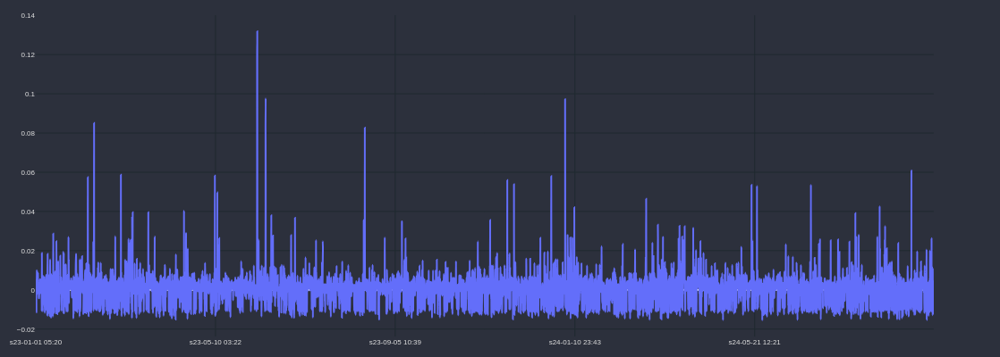

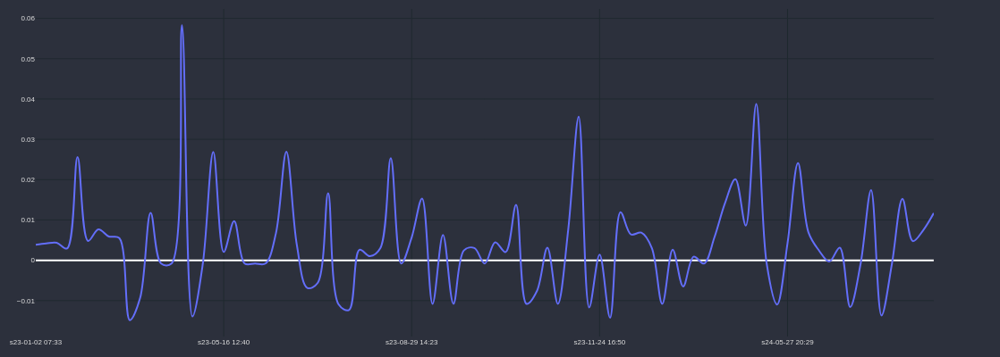

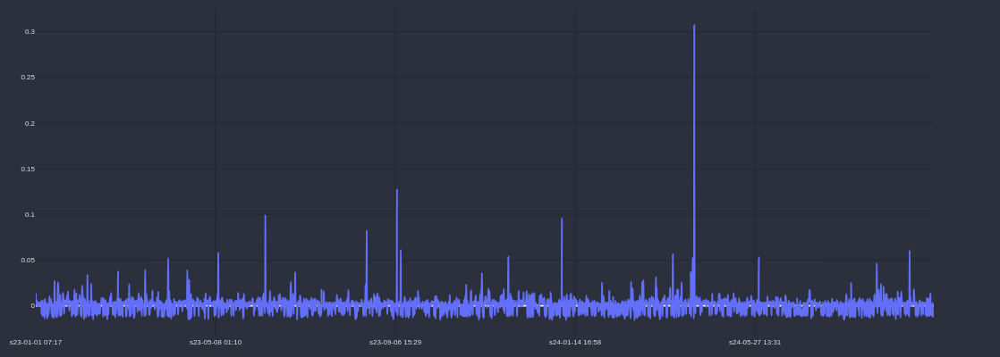

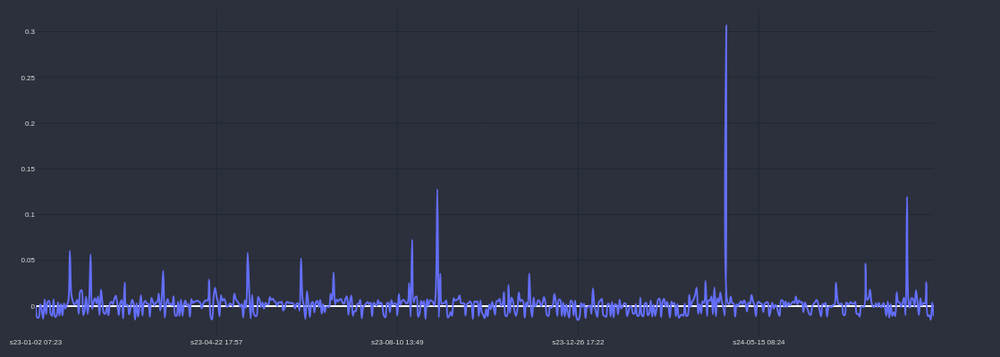

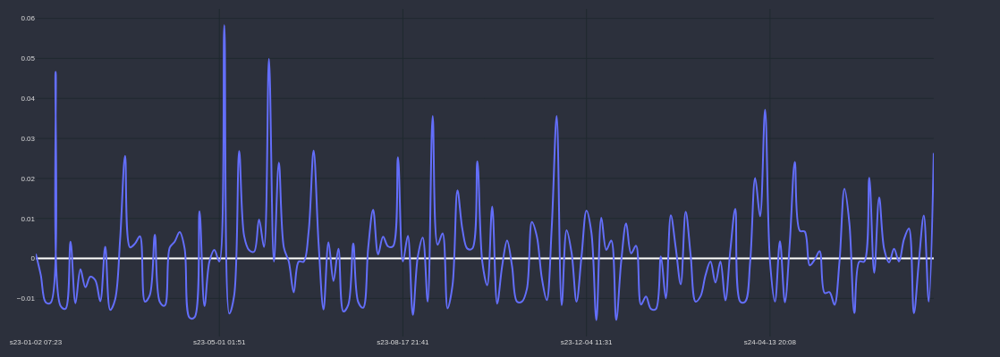

In [52]:
for index in range(len(rank_dict['VIDTUSDT'])):
    rank = rank_dict['VIDTUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy_pair1

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

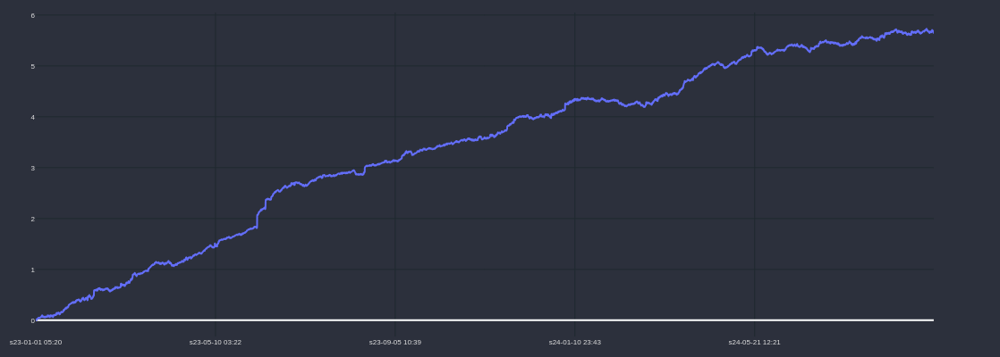

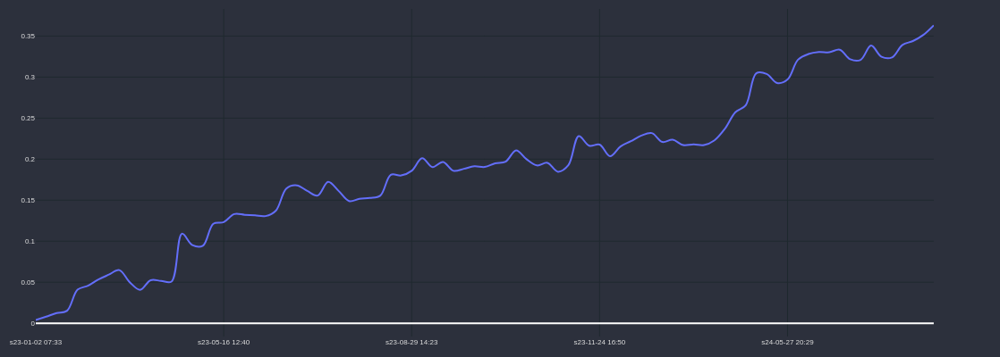

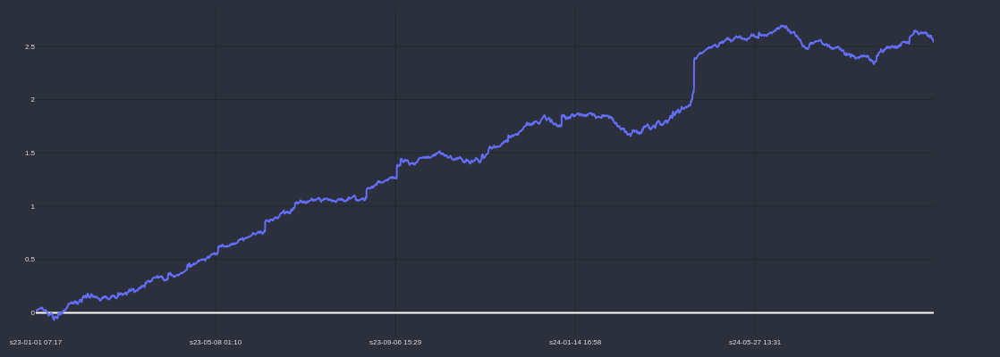

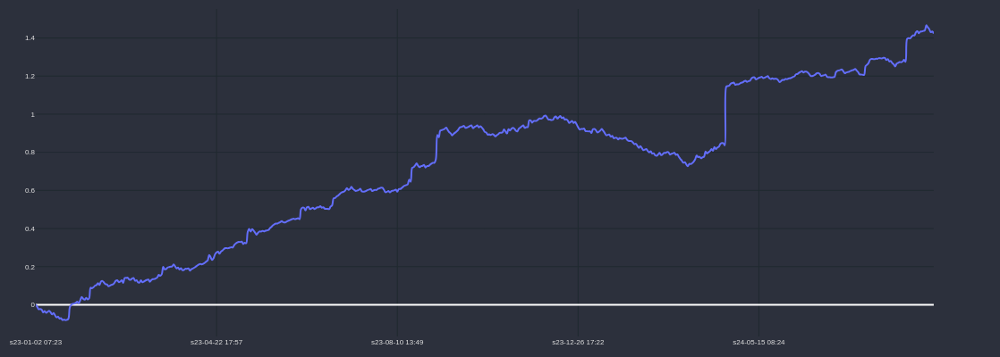

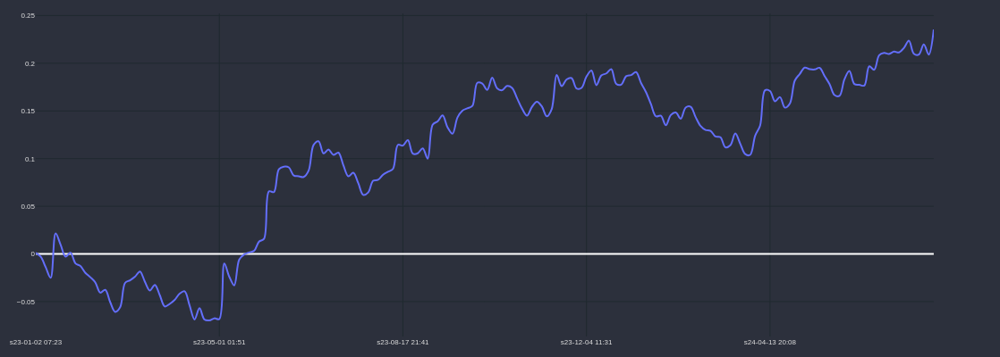

In [57]:
for index in range(len(rank_dict['VIDTUSDT'])):
    rank = rank_dict['VIDTUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy_pair1.cumsum()

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

In [53]:
def calcular_operacoes_simultaneas(df):
    # Ordena o DataFrame por start_time para facilitar o cálculo
    df = df.sort_values(by='start_time').reset_index(drop=True)
    # Inicializa a coluna operacoes_simultaneas com o valor mínimo de 0
    df['operacoes_simultaneas'] = 0
    
    # Itera sobre cada operação e conta quantas estão abertas e não fechadas no momento
    for i, row in df.iterrows():
        # Conta quantas operações estão em andamento no tempo de start_time da operação atual
        count = ((df['start_time'] <= row['start_time']) & (df['end_time'] > row['start_time'])).sum()
        # Atualiza a coluna com o número de operações simultâneas, garantindo o mínimo de 1
        df.at[i, 'operacoes_simultaneas'] = max(count, 1)
        
    return df

In [54]:

# Concatenar os DataFrames filtrados, acessando os 10 primeiros elementos do atributo `r` de cada um
concat_ranks = pd.concat(
    [
        rank_dict['VIDTUSDT'].iloc[index].r for index in range(len(rank_dict['VIDTUSDT']))
    ]
)


In [55]:
concat_ranks.shape

(8995, 21)

In [56]:
concat_ranks.strategy_pair1.sum()

np.float64(10.215048129364225)

In [40]:
df_test = calcular_operacoes_simultaneas(concat_ranks)
df_test.operacoes_simultaneas.max()

np.int64(10)

In [41]:
df_test.tail()

,running,start_index_m5,count,trigger_type,strategy_pair1,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
8990,False,919316,63,0,-0.011702,-0.010902,1,False,0,0.00500,-0.010000,buy,0.04519,0.04470,1,0,-0.00049,2024-09-30 15:38:00,2024-09-30 14:36:00,2024-09-30 15:38:00,-0.011702,1
8991,False,919488,20,0,-0.012211,-0.011411,1,False,0,0.00500,-0.010000,sell,0.04531,0.04583,0,1,-0.00052,2024-09-30 17:47:00,2024-09-30 17:28:00,2024-09-30 17:47:00,-0.012211,1
8992,False,919496,18,0,-0.011491,-0.010691,1,False,0,0.00500,-0.010000,sell,0.04559,0.04608,0,1,-0.00049,2024-09-30 17:53:00,2024-09-30 17:36:00,2024-09-30 17:53:00,-0.011491,2
8993,False,919720,36,0,0.004393,0.005193,1,False,1,0.01125,0.005054,sell,0.04634,0.04610,0,1,0.00024,2024-09-30 21:55:00,2024-09-30 21:20:00,2024-09-30 21:55:00,0.004393,1
8994,False,919822,32,0,0.001405,0.002205,1,False,1,0.01000,0.004984,buy,0.04531,0.04541,1,0,0.00010,2024-09-30 23:33:00,2024-09-30 23:02:00,2024-09-30 23:33:00,0.001405,1


In [42]:
concat_ranks.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy_pair1',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'trailing_stop_target', 'trailing_stop_loss', 'type', 'start_price',
       'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN', 'result', 'end_time',
       'start_time', 'time', 'GAIN_I'],
      dtype='object')

In [43]:
df_test.strategy_pair1.sum()

np.float64(10.215048129364225)

In [44]:
(5000/df_test.operacoes_simultaneas.max()) * df_test.strategy_pair1.sum()

np.float64(5107.524064682113)

In [45]:
df_test.tail()

,running,start_index_m5,count,trigger_type,strategy_pair1,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
8990,False,919316,63,0,-0.011702,-0.010902,1,False,0,0.00500,-0.010000,buy,0.04519,0.04470,1,0,-0.00049,2024-09-30 15:38:00,2024-09-30 14:36:00,2024-09-30 15:38:00,-0.011702,1
8991,False,919488,20,0,-0.012211,-0.011411,1,False,0,0.00500,-0.010000,sell,0.04531,0.04583,0,1,-0.00052,2024-09-30 17:47:00,2024-09-30 17:28:00,2024-09-30 17:47:00,-0.012211,1
8992,False,919496,18,0,-0.011491,-0.010691,1,False,0,0.00500,-0.010000,sell,0.04559,0.04608,0,1,-0.00049,2024-09-30 17:53:00,2024-09-30 17:36:00,2024-09-30 17:53:00,-0.011491,2
8993,False,919720,36,0,0.004393,0.005193,1,False,1,0.01125,0.005054,sell,0.04634,0.04610,0,1,0.00024,2024-09-30 21:55:00,2024-09-30 21:20:00,2024-09-30 21:55:00,0.004393,1
8994,False,919822,32,0,0.001405,0.002205,1,False,1,0.01000,0.004984,buy,0.04531,0.04541,1,0,0.00010,2024-09-30 23:33:00,2024-09-30 23:02:00,2024-09-30 23:33:00,0.001405,1


In [46]:
df_test.describe()

,start_index_m5,count,trigger_type,strategy_pair1,strategy_no_tc,total_opened,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
count,8995.000000,8995.000000,8995.0,8995.000000,8995.000000,8995.000000,8995.000000,8995.000000,8995.000000,8995.000000,8995.000000,8995.000000,8995.000000,8995.000000,8995,8995,8995,8995.000000,8995.000000
mean,452822.181990,60.680267,0.0,0.001136,0.001621,1.080378,0.513730,0.010559,-0.001209,0.030185,0.030173,0.459366,0.540634,0.000050,2023-11-11 16:31:40.195664384,2023-11-11 15:31:59.379655424,2023-11-11 16:31:40.195664384,0.001136,1.622123
min,78.000000,1.000000,0.0,-0.015677,-0.039354,1.000000,0.000000,0.005000,-0.010000,0.014290,0.014210,0.000000,0.000000,-0.002090,2023-01-01 05:20:00,2023-01-01 04:38:00,2023-01-01 05:20:00,-0.015677,1.000000
25%,223403.000000,12.000000,0.0,-0.002213,-0.001812,1.000000,0.000000,0.005000,-0.010000,0.021550,0.021560,0.000000,0.000000,-0.000050,2023-06-05 15:38:00,2023-06-05 08:03:00,2023-06-05 15:38:00,-0.002213,1.000000
50%,442193.000000,27.000000,0.0,0.002123,0.002812,1.000000,1.000000,0.007500,0.003365,0.029780,0.029760,0.000000,1.000000,0.000070,2023-11-04 07:28:00,2023-11-04 06:33:00,2023-11-04 07:28:00,0.002123,1.000000
75%,684883.000000,56.000000,0.0,0.004320,0.004991,1.000000,1.000000,0.010000,0.004731,0.036590,0.036580,1.000000,1.000000,0.000150,2024-04-20 20:09:00,2024-04-20 19:23:00,2024-04-20 20:09:00,0.004320,2.000000
max,919822.000000,33154.000000,0.0,0.306974,0.307774,3.000000,1.000000,0.648732,0.305209,0.068330,0.068900,1.000000,1.000000,0.012830,2024-09-30 23:33:00,2024-09-30 23:02:00,2024-09-30 23:33:00,0.306974,10.000000
std,264692.374606,521.239786,0.0,0.010066,0.010296,0.283111,0.499839,0.017001,0.011288,0.010013,0.010006,0.498374,0.498374,0.000357,NaN,NaN,NaN,0.010066,0.970352


In [47]:
df_test = df_test.sort_values(by='end_time', ascending=True).reset_index(drop=True)
df_test.head()

,running,start_index_m5,count,trigger_type,strategy_pair1,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
0,False,78,43,0,0.002291,0.003091,1,False,1,0.007500,0.003352,sell,0.02592,0.02584,0,1,0.00008,2023-01-01 05:20:00,2023-01-01 04:38:00,2023-01-01 05:20:00,0.002291,1
1,False,79,159,0,0.013555,0.014355,1,False,1,0.025313,0.014801,sell,0.02596,0.02559,0,1,0.00037,2023-01-01 07:17:00,2023-01-01 04:39:00,2023-01-01 07:17:00,0.013555,2
2,False,133,109,0,0.002738,0.003538,1,False,1,0.010000,0.003405,buy,0.02539,0.02548,1,0,0.00009,2023-01-01 07:21:00,2023-01-01 05:33:00,2023-01-01 07:21:00,0.002738,2
3,False,324,63,0,0.005061,0.005861,1,False,0,0.005000,-0.010000,sell,0.02567,0.02552,0,1,0.00015,2023-01-01 09:46:00,2023-01-01 08:44:00,2023-01-01 09:46:00,0.005061,1
4,False,476,153,0,0.001163,0.001963,1,False,0,0.005000,-0.010000,buy,0.02544,0.02549,1,0,0.00005,2023-01-01 13:48:00,2023-01-01 11:16:00,2023-01-01 13:48:00,0.001163,1


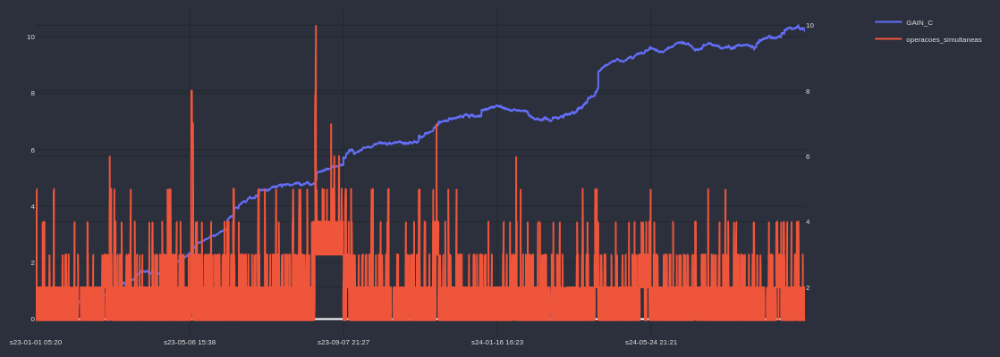

In [48]:

df_test['time'] = df_test['end_time']
df_test['GAIN_C'] = df_test.strategy_pair1.cumsum()

cp = CandlePlot(df_test, candles=False)
cp.show_plot(line_traces = ['GAIN_C'], sec_traces=['operacoes_simultaneas'])

In [49]:
pos = df_test[df_test['strategy_pair1']>0]
neg = df_test[df_test['strategy_pair1']<0]

print(len(pos),len(neg), len(pos)/(len(pos)+len(neg)))

5971 3024 0.6638132295719844


In [50]:
df_test.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy_pair1',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'trailing_stop_target', 'trailing_stop_loss', 'type', 'start_price',
       'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN', 'result', 'end_time',
       'start_time', 'time', 'GAIN_I', 'operacoes_simultaneas', 'GAIN_C'],
      dtype='object')

In [51]:
import numpy as np
import pandas as pd

def calcular_retorno_dinamico_com_alavancagem(df, saldo_total, alavancagem=1, percentual_capital=10):
    """
    Calcula o retorno acumulado em dólar com controle de reserva, considerando operações simultâneas e mantendo
    o saldo total inalterado até que as operações sejam fechadas. Adiciona incremento de 2% ao capital usado.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo as colunas `start_time`, `end_time`, e `strategy`.
        saldo_total (float): Saldo total inicial disponível para operações.
        alavancagem (float): Fator de alavancagem a ser aplicado nas operações.
        percentual_capital (float): Percentual do saldo total a ser usado em cada operação.

    Retorno:
        pd.DataFrame: DataFrame atualizado com colunas adicionais e métricas.
    """
    # Ordenar o DataFrame pelo tempo de abertura
    df = df.sort_values(by="start_time").reset_index(drop=True)

    # Inicializar arrays e variáveis
    n = len(df)
    capital_usado = saldo_total / percentual_capital
    incremento_percentual = 0.0

    status = np.full(n, "fechada", dtype=object)
    retorno_dolar = np.zeros(n)
    capital_acumulado = np.full(n, saldo_total)
    saldo_total_arr = np.full(n, saldo_total)
    capital_usado_arr = np.zeros(n)

    for i in range(n):
        # Fechar operações cujo end_time já passou
        abertas = (status == "aberta") & (df["end_time"].values <= df["start_time"].iloc[i])
        for j in np.where(abertas)[0]:
            retorno_alavancado = alavancagem * (df["strategy_pair1"].iloc[j] * capital_usado_arr[j])
            saldo_total += retorno_alavancado  # Atualizar saldo total com o retorno da operação
            retorno_dolar[j] = retorno_alavancado
            status[j] = "fechada"
            # Recalcular o capital usado após fechar uma operação
            capital_usado = saldo_total / percentual_capital

        # Incrementar o capital usado em 2% para a nova operação
        capital_usado *= (1 + incremento_percentual)
        capital_usado_arr[i] = capital_usado

        # Marcar a operação como aberta
        status[i] = "aberta"

        # Atualizar o saldo acumulado e saldo total
        saldo_total_arr[i] = saldo_total
        capital_acumulado[i] = saldo_total

    # Adicionar os resultados ao DataFrame
    df["capital_usado"] = capital_usado_arr
    df["retorno_dolar"] = retorno_dolar
    df["capital_acumulado"] = capital_acumulado
    df["saldo_total"] = saldo_total_arr
    df["status"] = status

    print("Resumo Final:")
    print(f"Saldo total final: ${saldo_total:.2f}")
    return df


In [52]:
df_test.operacoes_simultaneas.mean()

np.float64(1.6221234018899389)

In [55]:
# valor_inicial = 5.0
saldo_total = 1000.0

# Exemplo de uso com alavancagem
df_resultado_dinamico_alavancagem = calcular_retorno_dinamico_com_alavancagem(
    df_test, saldo_total, alavancagem=3, percentual_capital=4
)

Resumo Final:
Saldo total final: $1159765.77


In [56]:
df_test.strategy_pair1.sum()

np.float64(10.215048129364224)

In [57]:
df_resultado_dinamico_alavancagem[["start_time", "end_time", "strategy_pair1", "capital_usado", "retorno_dolar",
              "capital_acumulado", "saldo_total"]].head(2500)

,start_time,end_time,strategy_pair1,capital_usado,retorno_dolar,capital_acumulado,saldo_total
0,2023-01-01 04:38:00,2023-01-01 05:20:00,0.002291,250.000000,1.718394,1000.000000,1000.000000
1,2023-01-01 04:39:00,2023-01-01 07:17:00,0.013555,250.000000,10.166431,1000.000000,1000.000000
2,2023-01-01 05:33:00,2023-01-01 07:21:00,0.002738,250.429599,2.057356,1001.718394,1001.718394
3,2023-01-01 08:44:00,2023-01-01 09:46:00,0.005061,253.485545,3.848318,1013.942181,1013.942181
4,2023-01-01 11:16:00,2023-01-01 13:48:00,0.001163,254.447625,0.888134,1017.790500,1017.790500
5,2023-01-01 15:32:00,2023-01-01 16:27:00,-0.011466,254.669658,-8.759909,1018.678634,1018.678634
6,2023-01-01 15:46:00,2023-01-01 17:53:00,0.005479,254.669658,4.186353,1018.678634,1018.678634
7,2023-01-01 21:28:00,2023-01-01 22:03:00,0.005061,253.526270,3.848937,1014.105078,1014.105078
8,2023-01-01 21:44:00,2023-01-01 22:03:00,0.005839,253.526270,4.441288,1014.105078,1014.105078
9,2023-01-01 22:15:00,2023-01-02 03:03:00,0.005448,255.598826,4.177185,1022.395303,1022.395303


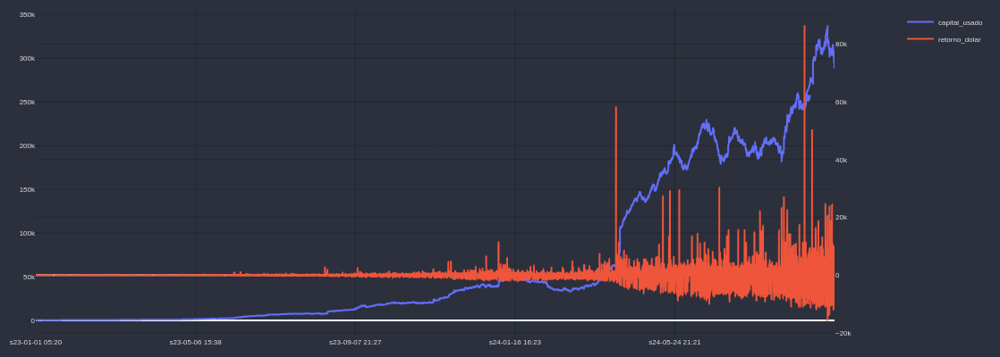

In [58]:
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_usado'], sec_traces=['retorno_dolar'])

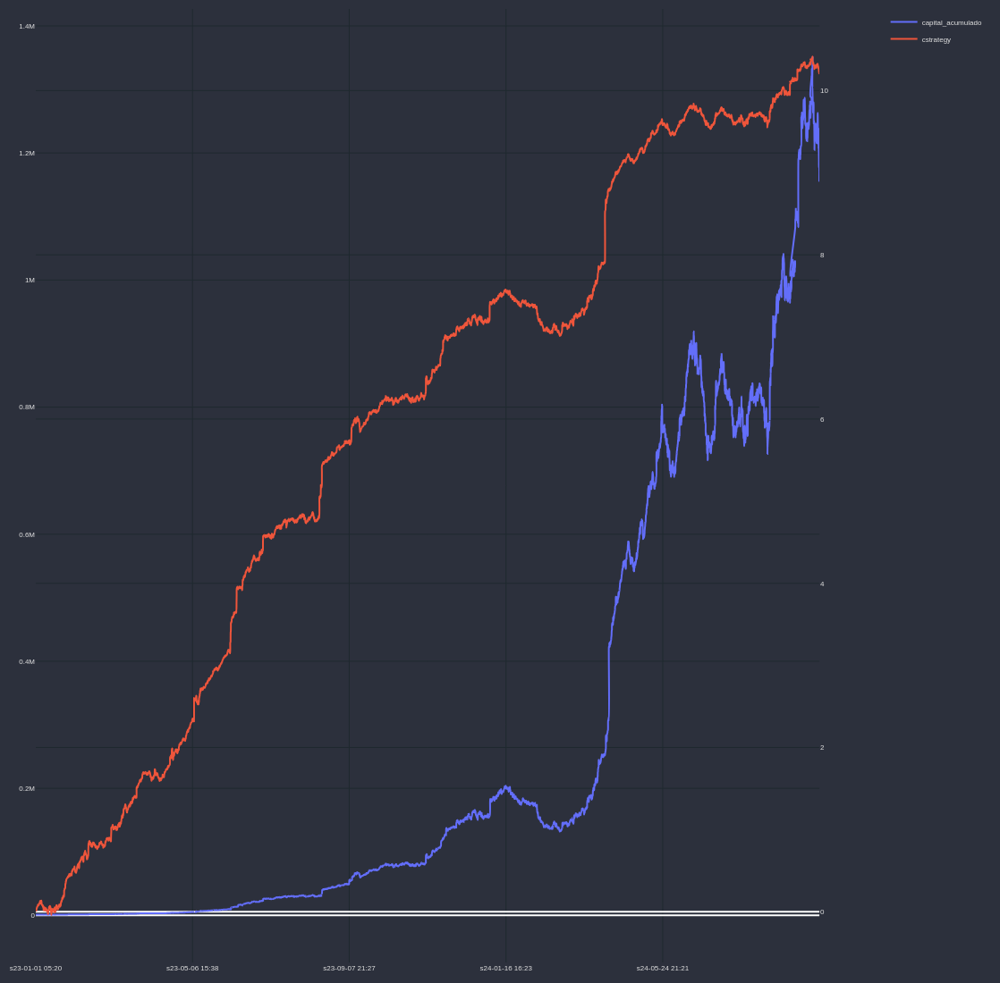

In [59]:
df_resultado_dinamico_alavancagem['cstrategy'] = df_resultado_dinamico_alavancagem.strategy_pair1.cumsum()
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_acumulado'], sec_traces=['cstrategy'], height=1100)